# fig 4

In [2]:
import sys
sys.path.insert(0,'/DATA/User/zuolulu/spateo-release')
sys.path.insert(0,'/DATA/User/zuolulu/dynamo-release')
import spateo as st
import dynamo as dyn
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import anndata as ad
import os
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import dotplot 
import dotplot.utils 

2022-07-30 20:15:36.673648: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-07-30 20:15:36.677859: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/zuolulu/miniconda3/envs/spateo/lib/python3.8/site-packages/opencv_python-4.5.5.64-py3.8-linux-x86_64.egg/cv2/../../lib64:
2022-07-30 20:15:36.677872: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
/home/zuolulu/miniconda3/envs/spateo/lib/python3.8/site-packages/spaghetti-1.6.5-py3.8.egg/spaghetti/network.py:36: FutureWarning:

The next major release of pysal/spaghett

|-----> setting visualization default mode in dynamo. Your customized matplotlib settings might be overritten.


## 0. 2DPI summary

In [3]:
adata=ad.read("../06.axolotl/data/2DPI_1.h5ad")
adata

AnnData object with n_obs × n_vars = 7668 × 27324
    obs: 'CellID', 'spatial_leiden_e30_s8', 'Batch', 'cell_id', 'seurat_clusters', 'inj_uninj', 'D_V', 'inj_M_L', 'Annotation'
    var: 'Axolotl_ID', 'hs_gene'
    uns: 'Annotation_colors', 'Injury_2DPI_rep1_SS200000147BL_D5', '__type', 'angle_dict'
    obsm: 'X_pca', 'X_spatial', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [4]:
sub=ad.read("../06.axolotl/data/mydata/2DPI_injury_sub.h5ad")
sub

AnnData object with n_obs × n_vars = 2843 × 27324
    obs: 'CellID', 'spatial_leiden_e30_s8', 'Batch', 'cell_id', 'seurat_clusters', 'inj_uninj', 'D_V', 'inj_M_L', 'Annotation', 'spec'
    var: 'Axolotl_ID', 'hs_gene'
    uns: 'Annotation_colors', 'Injury_2DPI_rep1_SS200000147BL_D5', '__type', 'angle_dict', 'spatial_neighbors', 'spec_colors'
    obsm: 'X_pca', 'X_spatial', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [5]:
color_key={'CCKIN': '#99cfdd',
 'CMPN': '#ccc8fb',
 'CP': '#666666',
 'dpEX': '#fffe2e',
 'IMN': '#95c454',
 'MCG': '#04047d',
 'mpEX': '#4ec602',
 'MPIN': '#1c9d79',
 'MSN': '#775613',
 'nptxEX': '#b904ab',
 'NPYIN': '#b58396',
 'NTNG1EX': '#fe3030',
 'OBNBL': '#02ffff',
 'OLIGO': '#AF5F3C',
 'reaEGC': '#e72988',
 'ribEGC': '#8eb3fb',
 'rIPC1': '#4166b0',
 'rIPC2': '#59BE86',
 'rIPC3': '#ffd29a',         
 'rIPC4': '#C798EE',
 'SCGNIN': '#e9c62a',
 'sfrpEGC': '#767da3',
 'SSTIN': '#525510',
 'TLNBL': '#4fbad6',
 'UnKnown': '#D1D1D1',
 'VLMC': '#FEB915',
 'wntEGC': '#828282',
 'WSN': '#6D1A9C'}

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


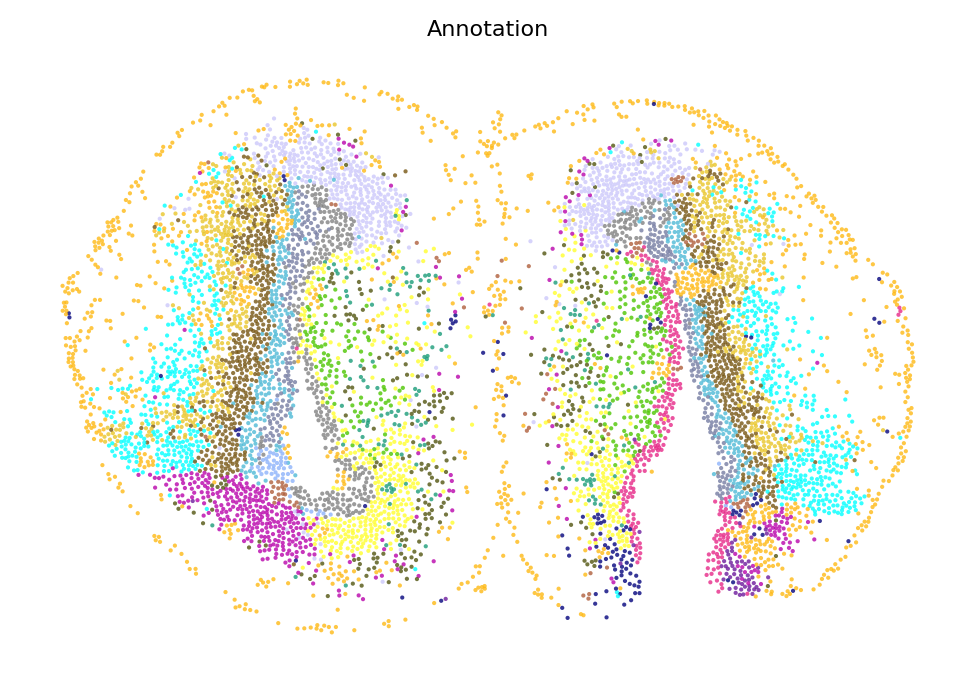

In [6]:
fig, ax = plt.subplots()
st.pl.space(adata, color=['Annotation'], pointsize=0.05,color_key=color_key,show_legend=False,ax=ax)
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
fig.set_size_inches(3,3)
#fig.savefig("2DPI.cluster.anno.pdf")

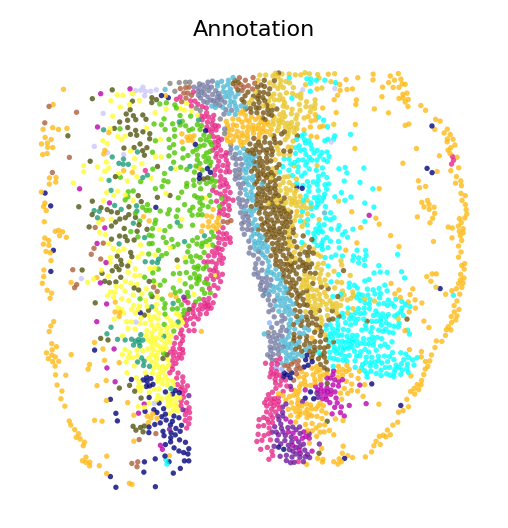

In [7]:
fig, ax = plt.subplots()
fig.set_size_inches(3,3)
st.pl.space(sub, color=['Annotation'], pointsize=0.05,color_key=color_key,show_legend=False,ax=ax)
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
#fig.savefig("2DPI.sub.cluster.anno.pdf")

In [8]:
### pearson_residuals
adata.uns["pp"] = {}
adata.layers['log1p'] = adata.X
adata.X = adata.layers['counts'].copy()

In [9]:
st.tl.pearson_residuals(adata, n_top_genes=None)

In [32]:
###  top 3000 genes
# st.tl.pearson_residuals(adata, n_top_genes=3000)
# adata1=adata[:,adata.var.gene_highly_variable]
# st.tl.pearson_residuals(adata1, n_top_genes=None)
# adata.obsm['pearson_residuals'] = adata1.obsm['pearson_residuals']

|-----> extracting highly variable genes


In [10]:
st.tl.pca_spateo(adata=adata,
                 #genes=adata1.var_names[adata1.var.gene_highly_variable],
                 X_data=adata.obsm["pearson_residuals"],
                 n_pca_components=30, random_state=2)
dyn.tl.neighbors(adata, n_neighbors=30)
#reduce Dimension
dyn.tl.reduceDimension(adata,)

|-----> Runing PCA on user provided data...
|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:pca
|-----> method arg is None, choosing methods automatically...
|-----------> method ball_tree selected
|-----> <insert> connectivities to obsp in AnnData Object.
|-----> <insert> distances to obsp in AnnData Object.
|-----> <insert> neighbors to uns in AnnData Object.
|-----> <insert> neighbors.indices to uns in AnnData Object.
|-----> <insert> neighbors.params to uns in AnnData Object.
|-----> retrive data for non-linear dimension reduction...
|-----> perform umap...
|-----> [dimension_reduction projection] in progress: 100.0000%
|-----> [dimension_reduction projection] finished [44.3393s]


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


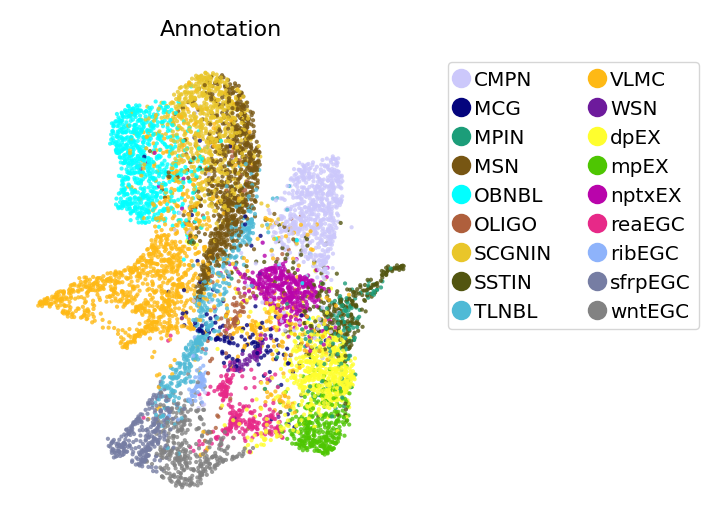

In [11]:
fig, ax = plt.subplots()
fig.set_size_inches(3,3)
st.pl.space(adata, color=['Annotation'], space="umap", pointsize=0.05,color_key=color_key,
            ax=ax,show_legend='upper left')
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
#fig.savefig("2DPI.umap.cluster.anno.pdf")

## 1. 2DPI left and right analysis
    injuv vs. uninj

In [275]:
adata=ad.read("../06.axolotl/data/2DPI_1.h5ad")
adata

AnnData object with n_obs × n_vars = 7668 × 27324
    obs: 'CellID', 'spatial_leiden_e30_s8', 'Batch', 'cell_id', 'seurat_clusters', 'inj_uninj', 'D_V', 'inj_M_L', 'Annotation'
    var: 'Axolotl_ID', 'hs_gene'
    uns: 'Annotation_colors', 'Injury_2DPI_rep1_SS200000147BL_D5', '__type', 'angle_dict'
    obsm: 'X_pca', 'X_spatial', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

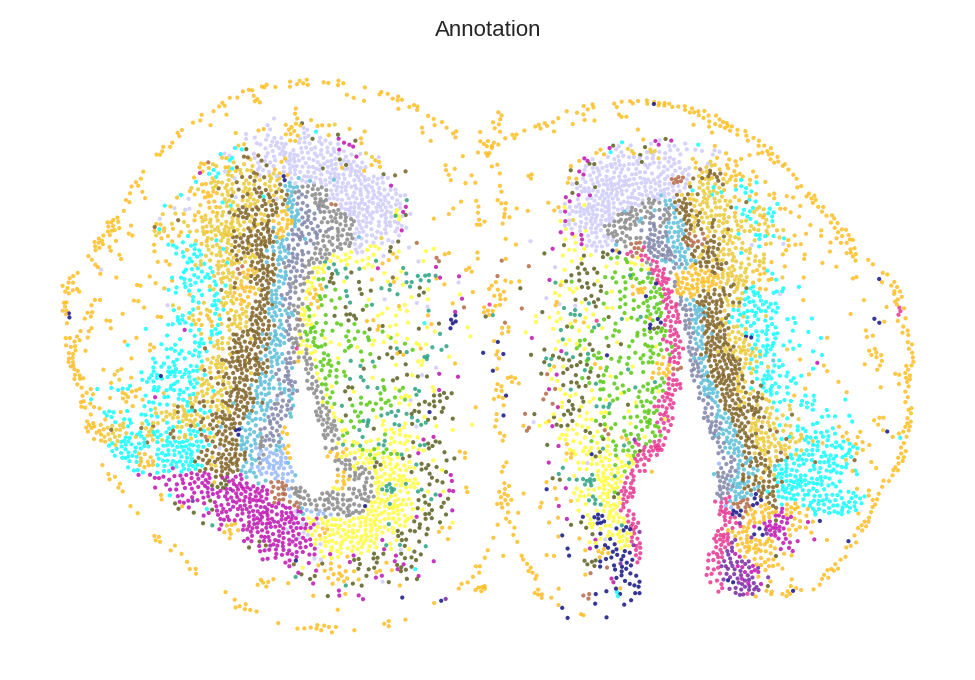

In [131]:
fig, ax = plt.subplots()
st.pl.space(adata, color=['Annotation'], pointsize=0.05,color_key=color_key,show_legend=False,ax=ax)
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
fig.set_size_inches(3,3)
#fig.savefig("2DPI.cluster.anno.pdf")

`Lasso interest subset of adata`

In [247]:
L = st.tl.Lasso(adata)
L.vi_plot(group='Annotation', group_color='Annotation_colors')

    'data': [{'marker': {'color': array(['#feb915', '#feb915', '#feb915', ..., '…

In [248]:
left = L.sub_adata
left

View of AnnData object with n_obs × n_vars = 4017 × 27324
    obs: 'CellID', 'spatial_leiden_e30_s8', 'Batch', 'cell_id', 'seurat_clusters', 'inj_uninj', 'D_V', 'inj_M_L', 'Annotation'
    var: 'Axolotl_ID', 'hs_gene'
    uns: 'Annotation_colors', 'Injury_2DPI_rep1_SS200000147BL_D5', '__type', 'angle_dict'
    obsm: 'X_pca', 'X_spatial', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [276]:
right_index = adata.obs.drop(index=left.obs.index).index

In [277]:
right = adata[right_index,:]
right

View of AnnData object with n_obs × n_vars = 3651 × 27324
    obs: 'CellID', 'spatial_leiden_e30_s8', 'Batch', 'cell_id', 'seurat_clusters', 'inj_uninj', 'D_V', 'inj_M_L', 'Annotation'
    var: 'Axolotl_ID', 'hs_gene'
    uns: 'Annotation_colors', 'Injury_2DPI_rep1_SS200000147BL_D5', '__type', 'angle_dict'
    obsm: 'X_pca', 'X_spatial', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

### panel b

In [68]:
df_uninjury = left.obs['Annotation'].value_counts().sort_index()
df_injury = right.obs['Annotation'].value_counts().sort_index()

df_c = pd.concat([df_uninjury, df_injury], axis=1)
df_c.columns=['uninj_left', 'injury_right']
df_cp = (df_c/df_c.sum(axis=0)).T

In [70]:
index = df_cp.columns
uninj = df_cp.iloc[0].values
inj = df_cp.iloc[1].values

Text(0.5, 0, 'Relative Proportion')

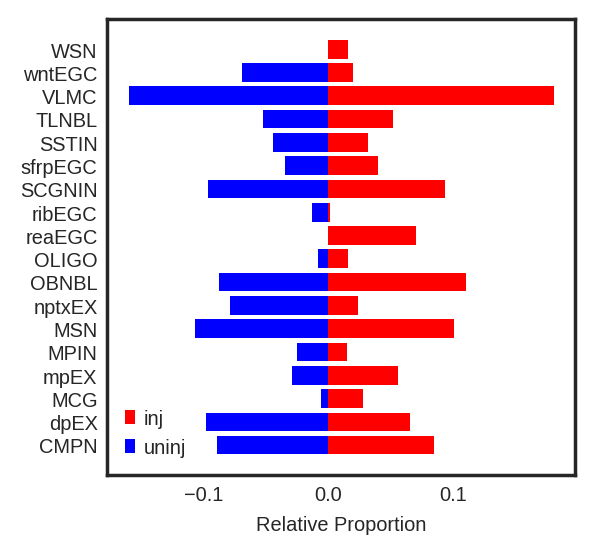

In [71]:
fig = plt.figure()
fig.set_size_inches(3,3)
plt.barh(index,inj,color='red',height=0.8)
plt.barh(index,-np.array(uninj),color='blue',height=0.8)
plt.legend(('inj','uninj'))
#plt.xticks([])
plt.xlabel("Relative Proportion")
#plt.ylabel("Ligand")
#fig.savefig("2DPI_barh_left_right_ratio.pdf")

### panel c

In [140]:
adata = left

In [141]:
dyn.tl.neighbors(adata, X_data=adata.obsm['spatial'] ,n_neighbors=10, basis='pca', result_prefix="spatial")

|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> <insert> spatial_connectivities to obsp in AnnData Object.
|-----> <insert> spatial_distances to obsp in AnnData Object.
|-----> <insert> spatial_neighbors to uns in AnnData Object.
|-----> <insert> spatial_neighbors.indices to uns in AnnData Object.
|-----> <insert> spatial_neighbors.params to uns in AnnData Object.


AnnData object with n_obs × n_vars = 4015 × 27324
    obs: 'CellID', 'spatial_leiden_e30_s8', 'Batch', 'cell_id', 'seurat_clusters', 'inj_uninj', 'D_V', 'inj_M_L', 'Annotation', 'spec'
    var: 'Axolotl_ID', 'hs_gene'
    uns: 'Annotation_colors', 'Injury_2DPI_rep1_SS200000147BL_D5', '__type', 'angle_dict', 'spec_colors', 'spatial_neighbors'
    obsm: 'X_pca', 'X_spatial', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [142]:
sender_ct = 'wntEGC'
receptor_ct = 'dpEX'

`plot all cell pair`

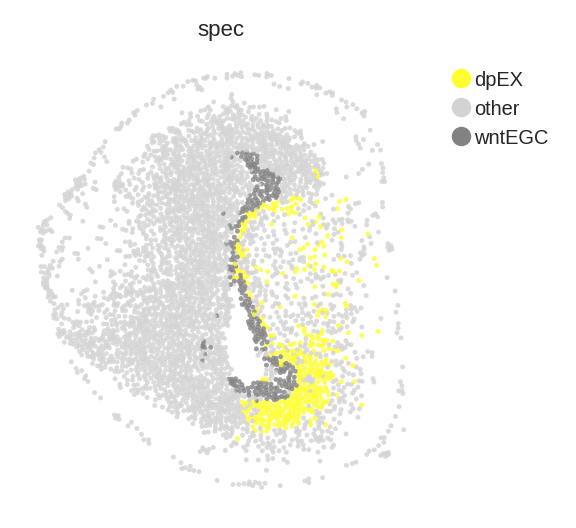

In [144]:
adata.obs['spec'] = 'other'
adata.obs.loc[adata.obs['Annotation']==sender_ct,'spec']=sender_ct
adata.obs.loc[adata.obs['Annotation']==receptor_ct,'spec']=receptor_ct
adata.obs['spec'] = adata.obs['spec'].apply(str).astype('category')
##plot all cell pair
fig, ax = plt.subplots()
fig.set_size_inches(3,3)
st.pl.space(adata, color=['spec'], pointsize=0.05,
            color_key={'other':'#D3D3D3',sender_ct:color_key[sender_ct],receptor_ct:color_key[receptor_ct]},
            show_legend='upper left',
            ax=ax)
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
#fig.savefig("2DPI_uninjury_cci_"+sender_ct+"_"+receptor_ct+"_all_cell_pair.pdf")

`st.tl.find_cci_two_group`

In [145]:
globals()[sender_ct+'_'+receptor_ct] = st.tl.find_cci_two_group(adata,
                               path='/DATA/User/zuolulu/spateo-release/spateo/tools/database/',
                               species='axolotl',
                               group='Annotation',
                               sender_group= sender_ct,
                               receiver_group = receptor_ct,
                               filter_lr='outer',
                               min_pairs = 0,
                               min_pairs_ratio = 0,
                               top = 20,
                               )

`plot spatial neighbors cell pair`

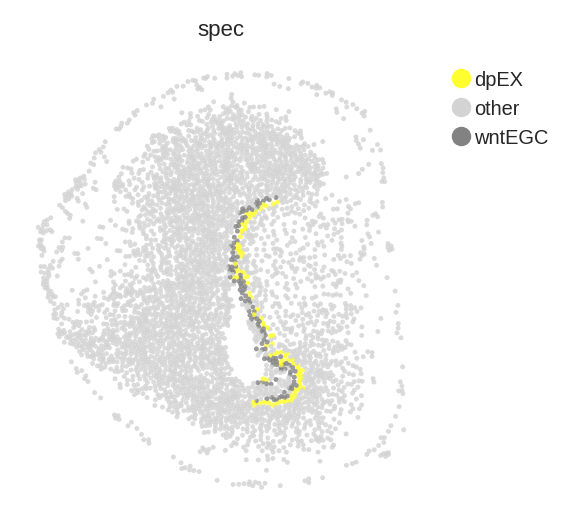

In [148]:
adata.obs['spec'] = 'other'
adata.obs.loc[adata.obs.index.isin(globals()[sender_ct+'_'+receptor_ct]['cell_pair']['cell_sender'].tolist()),'spec']=sender_ct
adata.obs.loc[adata.obs.index.isin(globals()[sender_ct+'_'+receptor_ct]['cell_pair']['cell_receiver'].tolist()),'spec']=receptor_ct
adata.obs['spec'] = adata.obs['spec'].apply(str).astype('category')
#plot
fig, ax = plt.subplots()
fig.set_size_inches(3,3)
st.pl.space(adata, color=['spec'], pointsize=0.05,
            color_key={'other':'#D3D3D3',sender_ct:color_key[sender_ct],receptor_ct:color_key[receptor_ct]},
            show_legend='upper left',
            ax=ax)
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
#fig.savefig("2DPI_uninjury_cci_"+sender_ct+"_"+receptor_ct+"_cell_pair.pdf")

In [149]:
adata = right

In [150]:
dyn.tl.neighbors(adata, X_data=adata.obsm['spatial'] ,n_neighbors=10, basis='pca', result_prefix="spatial")

|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> <insert> spatial_connectivities to obsp in AnnData Object.
|-----> <insert> spatial_distances to obsp in AnnData Object.
|-----> <insert> spatial_neighbors to uns in AnnData Object.
|-----> <insert> spatial_neighbors.indices to uns in AnnData Object.
|-----> <insert> spatial_neighbors.params to uns in AnnData Object.


AnnData object with n_obs × n_vars = 3653 × 27324
    obs: 'CellID', 'spatial_leiden_e30_s8', 'Batch', 'cell_id', 'seurat_clusters', 'inj_uninj', 'D_V', 'inj_M_L', 'Annotation'
    var: 'Axolotl_ID', 'hs_gene'
    uns: 'Annotation_colors', 'Injury_2DPI_rep1_SS200000147BL_D5', '__type', 'angle_dict', 'spatial_neighbors'
    obsm: 'X_pca', 'X_spatial', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [151]:
sender_ct = 'reaEGC'
receptor_ct = 'dpEX'

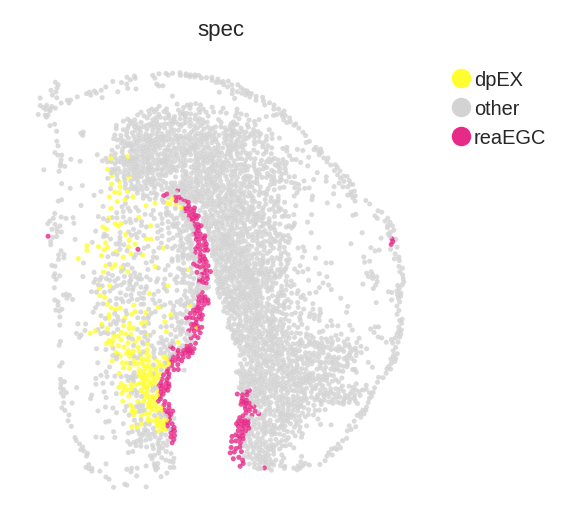

In [152]:
adata.obs['spec'] = 'other'
adata.obs.loc[adata.obs['Annotation']==sender_ct,'spec']=sender_ct
adata.obs.loc[adata.obs['Annotation']==receptor_ct,'spec']=receptor_ct
adata.obs['spec'] = adata.obs['spec'].apply(str).astype('category')
##plot
fig, ax = plt.subplots()
fig.set_size_inches(3,3)
st.pl.space(adata, color=['spec'], pointsize=0.05,
            color_key={'other':'#D3D3D3',sender_ct:color_key[sender_ct],receptor_ct:color_key[receptor_ct]},
            show_legend='upper left',
            ax=ax)
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
#fig.savefig("2DPI_uninjury_cci_"+sender_ct+"_"+receptor_ct+"_all_cell_pair.pdf")

In [153]:
globals()[sender_ct+'_'+receptor_ct] = st.tl.find_cci_two_group(adata,
                               path='/DATA/User/zuolulu/spateo-release/spateo/tools/database/',
                               species='axolotl',
                               group='Annotation',
                               sender_group= sender_ct,
                               receiver_group = receptor_ct,
                               filter_lr='outer',
                               min_pairs = 0,
                               min_pairs_ratio = 0,
                               top = 20,
                               )

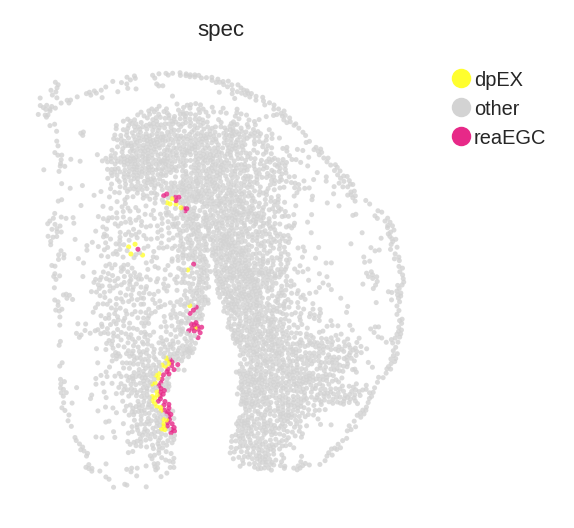

In [157]:
adata.obs['spec'] = 'other'
adata.obs.loc[adata.obs.index.isin(globals()[sender_ct+'_'+receptor_ct]['cell_pair']['cell_sender'].tolist()),'spec']=sender_ct
adata.obs.loc[adata.obs.index.isin(globals()[sender_ct+'_'+receptor_ct]['cell_pair']['cell_receiver'].tolist()),'spec']=receptor_ct
adata.obs['spec'] = adata.obs['spec'].apply(str).astype('category')
#plot
fig, ax = plt.subplots()
fig.set_size_inches(3,3)
st.pl.space(adata, color=['spec'], pointsize=0.05,
            color_key={'other':'#D3D3D3',sender_ct:color_key[sender_ct],receptor_ct:color_key[receptor_ct]},
            show_legend='upper left',
            ax=ax)
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
#fig.savefig("2DPI_uninjury_cci_"+sender_ct+"_"+receptor_ct+"_cell_pair.pdf")

### panel d

In [182]:
adata = ad.read("../06.axolotl/data/mydata/"+"2DPI_"+location[1]+".h5ad")

In [183]:
adata.var_names

Index(['AMEX60DDU001014898', 'AMEX60DDU001014427', 'AMEX60DDU001014120',
       'LOC101595094[nr]|ZNF84[hs] | AMEX60DDU001013765', 'AMEX60DDU001013699',
       'AMEX60DDU001013434', 'PRDM7[nr]|PRDM9[hs] | AMEX60DDU001013047',
       'DPX16_21124[nr] | AMEX60DDU001013045',
       'LOC101531646[nr]|ZNF25[hs] | AMEX60DDU001012835',
       'TERF1 | AMEX60DDU001012475',
       ...
       'AMEX60DD012047', 'MADCAM1 | AMEX60DD013690',
       'LOC115100189[nr]|BTBD19[hs] | AMEX60DD019896',
       'LOC115482003[nr]|AMPD1[hs] | AMEX60DD008838',
       'GPC2[nr]|GPC6[hs] | AMEX60DD013179', 'AMEX60DD013883',
       'AMEX60DD006727', 'AMEX60DD018319', 'L3HYPDH | AMEX60DD011872',
       'AMEX60DD020732'],
      dtype='object', name='new_name', length=27324)

In [289]:
cluster = {'left':['wntEGC','dpEX','nptxEX','mpEX','dpEX'],
           'right':['reaEGC','WSN','mpEX','dpEX','MCG'],}
location = ['left','right']

In [290]:
for i,j in enumerate(['left','right']):
    adata = pickle.load(open("./data/mydata/2DPI_"+location[i]+".pkl", 'rb'))
    a = cluster[j]
    df = pd.DataFrame({
            "celltype_sender":np.repeat(a, len(a)),
            "celltype_receiver": list(a)*len(a),})
    df = df[df['celltype_sender'] != df['celltype_receiver']]
    df["celltype_pair"] = df["celltype_sender"].str.cat(df["celltype_receiver"], sep="-")
    
    res = {}
    for k in df['celltype_pair']:
        s,r = k.split(sep='-')
        res[k] = st.tl.find_cci_two_group(adata,
                       path='/DATA/User/zuolulu/spateo-release/spateo/tools/database/',
                       species='axolotl',
                       group='Annotation',
                       sender_group= s,
                       receiver_group = r,
                       filter_lr='outer',
                       min_pairs = 0,
                       min_pairs_ratio = 0,
                       top = 20,)
    globals()[j] = pd.DataFrame(columns=res[df['celltype_pair'][1]]['lr_pair'].columns)
    for l in df.index:
        res[df['celltype_pair'][l]]['lr_pair'] = res[df['celltype_pair'][l]]['lr_pair'].sort_values('lr_co_exp_ratio',ascending=False)[0:3]
        res[df['celltype_pair'][l]]['lr_pair']['location'] = location[i]
        globals()[j] = pd.concat([globals()[j],res[df['celltype_pair'][l]]['lr_pair']],axis=0,join='outer')

In [ ]:
df_left = left.loc[left['lr_co_exp_num']>3]
df_left['sr_pair_location'] = 'left:'+df_left['sr_pair']

In [ ]:
df_right = right.loc[right['lr_co_exp_num']>5]
df_right['sr_pair_location'] = 'right:'+df_right['sr_pair']

In [314]:
df = pd.concat([df_left,df_right],axis=0,join='outer')

In [ ]:
df.drop_duplicates(subset=['lr_pair','sr_pair','sr_pair_location'],keep='first',inplace=True)

In [2]:
#df.to_csv("2dpi_left_right.csv")
df = pd.read_csv("2dpi_left_right.csv",index_col=0)
df

,from,to,human_ligand,human_receptor,lr_pair,lr_co_exp_num,lr_co_exp_ratio,lr_co_exp_ratio_pvalue,sr_pair,location,sr_pair_location
1939,AMEX60DD056132,AMEX60DD055885,INHBB,ACVR2A,INHBB-ACVR2A,9,0.034351,0.000,wntEGC-dpEX,left,left:wntEGC-dpEX
1658,AMEX60DD029426,AMEX60DD016175,COL2A1,MAG,COL2A1-MAG,7,0.026718,0.000,wntEGC-dpEX,left,left:wntEGC-dpEX
2207,AMEX60DD049470,AMEX60DD030144,PDGFD,PDGFRB,PDGFD-PDGFRB,4,0.015267,0.000,wntEGC-dpEX,left,left:wntEGC-dpEX
2712,AMEX60DD032708,AMEX60DD042070,COL4A4,ITGA2,COL4A4-ITGA2,4,0.015038,0.000,dpEX-wntEGC,left,left:dpEX-wntEGC
1157,AMEX60DD055165,AMEX60DD016175,COL3A1,MAG,COL3A1-MAG,5,0.051020,0.013,dpEX-nptxEX,left,left:dpEX-nptxEX
187,AMEX60DD025767,AMEX60DD030144,PDAP1,PDGFRB,PDAP1-PDGFRB,5,0.020080,0.000,dpEX-mpEX,left,left:dpEX-mpEX
1258,AMEX60DD024186,AMEX60DD042985,GNAI2,S1PR3,GNAI2-S1PR3,5,0.020080,0.000,dpEX-mpEX,left,left:dpEX-mpEX
3331,AMEX60DD046082,AMEX60DD055359,SPON2,ITGB2,SPON2-ITGB2,8,0.031373,0.000,mpEX-dpEX,left,left:mpEX-dpEX
1388,AMEX60DD007022,AMEX60DD033101,PTN,SDC1,PTN-SDC1,12,0.166667,0.000,reaEGC-WSN,right,right:reaEGC-WSN
732,AMEX60DD050822,AMEX60DD033101,TNC,SDC1,TNC-SDC1,12,0.166667,0.000,reaEGC-WSN,right,right:reaEGC-WSN


In [19]:
test1=df.pivot(index='lr_pair', columns="sr_pair_location", values="lr_co_exp_ratio").fillna(0).T
test2=df.pivot(index='lr_pair', columns="sr_pair_location", values="lr_co_exp_ratio_pvalue").fillna(1).T

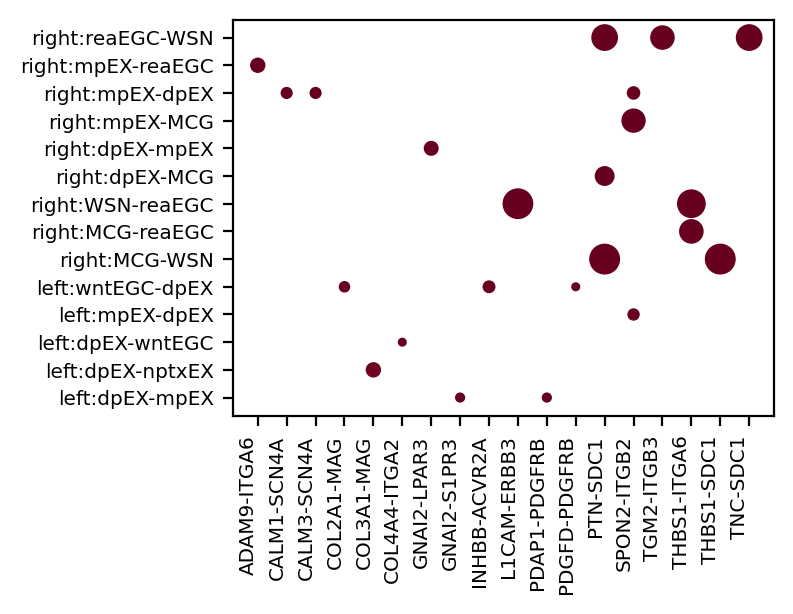

In [28]:
fig = plt.figure()
fig.set_size_inches(4,3)
m,n=(test1.shape[1],test1.shape[0]) 
x=np.linspace(1,2,m)
y=np.linspace(1,2,n)
X,Y=np.meshgrid(x,y)
S=test1.to_numpy()*500 #lr_co_exp_ratio:size
C=test2.to_numpy() #lr_co_exp_ratio_pvalue:size
plt.scatter(X, Y,s=S,c=C,cmap='RdGy')
plt.yticks(y,test1.index.tolist())
plt.xticks(x,test1.columns.tolist(),rotation=90,ha='right')
#plt.colorbar() 
plt.tight_layout()
plt.gcf().subplots_adjust(bottom=0.3)
plt.savefig("2dpi_left_right_dotplot_new.pdf")
plt.show()

## 2. 2DPI inju analysis
    reaEGC vs. WSN

In [7]:
adata=ad.read("../06.axolotl/data/mydata/2DPI_injury_sub.h5ad")
adata

AnnData object with n_obs × n_vars = 2843 × 27324
    obs: 'CellID', 'spatial_leiden_e30_s8', 'Batch', 'cell_id', 'seurat_clusters', 'inj_uninj', 'D_V', 'inj_M_L', 'Annotation', 'spec'
    var: 'Axolotl_ID', 'hs_gene'
    uns: 'Annotation_colors', 'Injury_2DPI_rep1_SS200000147BL_D5', '__type', 'angle_dict', 'spatial_neighbors', 'spec_colors'
    obsm: 'X_pca', 'X_spatial', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

### panel e

In [32]:
sender_ct = 'WSN'
receptor_ct = 'reaEGC'

In [37]:
globals()[sender_ct+'_'+receptor_ct] = st.tl.find_cci_two_group(adata,
                               path='/DATA/User/zuolulu/spateo-release/spateo/tools/database/',
                               species='axolotl',
                               group='Annotation',
                               sender_group= sender_ct,
                               receiver_group = receptor_ct,
                               filter_lr='outer',
                               min_pairs = 5,
                               min_pairs_ratio = 0,
                               top = 25,
                               )

In [46]:
df = globals()[sender_ct+'_'+receptor_ct]['lr_pair']
df = df.loc[df['lr_co_exp_num']>0].sort_values('lr_co_exp_ratio',ascending=False)[0:20]
df

,from,to,human_ligand,human_receptor,lr_pair,lr_co_exp_num,lr_co_exp_ratio,lr_co_exp_ratio_pvalue,sr_pair
2383,AMEX60DD025587,AMEX60DD029929,L1CAM,ERBB3,L1CAM-ERBB3,15,0.223881,0.000,WSN-reaEGC
582,AMEX60DD012285,AMEX60DD055675,THBS1,ITGA6,THBS1-ITGA6,13,0.194030,0.000,WSN-reaEGC
746,AMEX60DD044302,AMEX60DD029929,EGF,ERBB3,EGF-ERBB3,4,0.059701,0.000,WSN-reaEGC
2381,AMEX60DD043761,AMEX60DD029929,NRG1,ERBB3,NRG1-ERBB3,4,0.059701,0.000,WSN-reaEGC
301,AMEX60DD035117,AMEX60DD055675,LAMA4,ITGA6,LAMA4-ITGA6,3,0.044776,0.000,WSN-reaEGC
2380,AMEX60DD052019,AMEX60DD029929,NRG3,ERBB3,NRG3-ERBB3,3,0.044776,0.000,WSN-reaEGC
3343,AMEX60DD002596,AMEX60DD055675,ADAM9,ITGA6,ADAM9-ITGA6,3,0.044776,0.001,WSN-reaEGC
1937,AMEX60DD038105,AMEX60DD055885,INHBA,ACVR2A,INHBA-ACVR2A,2,0.029851,0.026,WSN-reaEGC
1670,AMEX60DD039130,AMEX60DD055675,LAMA1,ITGA6,LAMA1-ITGA6,2,0.029851,0.000,WSN-reaEGC
3342,AMEX60DD034687,AMEX60DD055675,LAMA2,ITGA6,LAMA2-ITGA6,2,0.029851,0.000,WSN-reaEGC


In [28]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import numpy as np
# import random
# import seaborn as sns
# df.to_csv("./plot_heatmap_input_LR.csv")
# df=pd.read_csv("/DATA/User/zuolulu/06.axolotl/plot_heatmap_input_LR.csv",index_col=0)

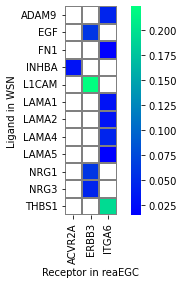

In [3]:
data1=df.iloc[:,[2,3,6]]
test=data1.pivot(index="human_ligand", columns="human_receptor", values="lr_co_exp_ratio").fillna(0)
fig = plt.figure()
fig.set_size_inches(5,5)
x_label=list(test.columns.tolist())
y_label=list(test.index)
sns.heatmap(test,cmap="winter",square=True,
            yticklabels=y_label,linecolor='grey',linewidths=0.3,
            annot_kws={'size':9,'weight':'bold',},
            xticklabels=x_label,mask=(test<0.01))
plt.gcf().subplots_adjust(bottom=0.3)
plt.xlabel("Receptor in reaEGC")
plt.ylabel("Ligand in WSN")
plt.savefig("2DPI_sub_cci_WSN_ReaEGC_heatmap.pdf")

In [8]:
sender_ct = 'reaEGC'
receptor_ct = 'WSN'

In [9]:
globals()[sender_ct+'_'+receptor_ct] = st.tl.find_cci_two_group(adata,
                               path='/DATA/User/zuolulu/spateo-release/spateo/tools/database/',
                               species='axolotl',
                               group='Annotation',
                               sender_group= sender_ct,
                               receiver_group = receptor_ct,
                               filter_lr='outer',
                               min_pairs = 5,
                               min_pairs_ratio = 0,
                               top = 25,
                               )

In [10]:
df = globals()[sender_ct+'_'+receptor_ct]['lr_pair']
df = df.loc[df['lr_co_exp_num']>0].sort_values('lr_co_exp_ratio',ascending=False)[0:20]
df

,from,to,human_ligand,human_receptor,lr_pair,lr_co_exp_num,lr_co_exp_ratio,lr_co_exp_ratio_pvalue,sr_pair
732,AMEX60DD050822,AMEX60DD033101,TNC,SDC1,TNC-SDC1,12,0.166667,0.000,reaEGC-WSN
1388,AMEX60DD007022,AMEX60DD033101,PTN,SDC1,PTN-SDC1,12,0.166667,0.000,reaEGC-WSN
1498,AMEX60DD028699,AMEX60DD009754,TGM2,ITGB3,TGM2-ITGB3,10,0.138889,0.000,reaEGC-WSN
1030,AMEX60DD001392,AMEX60DD055396,TGFA,ERBB4,TGFA-ERBB4,7,0.097222,0.000,reaEGC-WSN
570,AMEX60DD049502,AMEX60DD033101,MMP7,SDC1,MMP7-SDC1,4,0.055556,0.000,reaEGC-WSN
575,AMEX60DD012285,AMEX60DD033101,THBS1,SDC1,THBS1-SDC1,4,0.055556,0.000,reaEGC-WSN
947,AMEX60DD003175,AMEX60DD029326,SST,SSTR3,SST-SSTR3,4,0.055556,0.000,reaEGC-WSN
2406,AMEX60DD001392,AMEX60DD010312,TGFA,ERBB2,TGFA-ERBB2,3,0.041667,0.000,reaEGC-WSN
1510,AMEX60DD034565,AMEX60DD009754,THBS2,ITGB3,THBS2-ITGB3,2,0.027778,0.000,reaEGC-WSN
2249,AMEX60DD034565,AMEX60DD031636,THBS2,NOTCH3,THBS2-NOTCH3,2,0.027778,0.000,reaEGC-WSN


In [ ]:
#df.to_csv("./plot_heatmap_input_RL.csv")
#df=pd.read_csv("/DATA/User/zuolulu/06.axolotl/plot_heatmap_input_RL.csv",index_col=0)

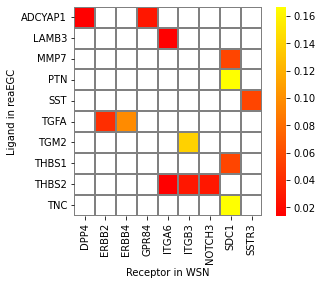

In [6]:
data1=df.iloc[:,[2,3,6]]
test=data1.pivot(index="human_ligand", columns="human_receptor", values="lr_co_exp_ratio").fillna(0)
fig = plt.figure()
fig.set_size_inches(5,5)
x_label=list(test.columns.tolist())
y_label=list(test.index)
sns.heatmap(test,cmap="autumn",square=True,
            yticklabels=y_label,linecolor='grey',linewidths=0.3,
            annot_kws={'size':9,'weight':'bold',},
            xticklabels=x_label,mask=(test<0.01))
plt.gcf().subplots_adjust(bottom=0.3)
plt.xlabel("Receptor in WSN")
plt.ylabel("Ligand in reaEGC")
plt.savefig("2DPI_sub_cci_ReaEGC_WSN_heatmap.pdf")

### panel f

In [9]:
sender_ct = 'WSN'
receptor_ct = 'reaEGC'

'plot all cell pair'

In [29]:
adata.obs['spec'] = 'other'
adata.obs.loc[adata.obs['Annotation']==sender_ct,'spec']=sender_ct
adata.obs.loc[adata.obs['Annotation']==receptor_ct,'spec']=receptor_ct
adata.obs['spec'] = adata.obs['spec'].apply(str).astype('category')

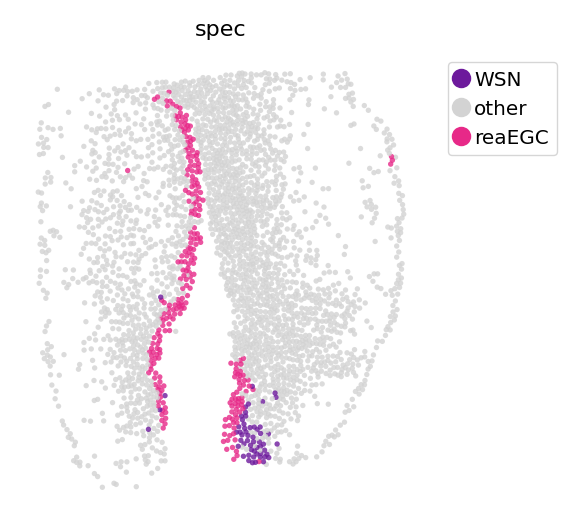

In [30]:
fig, ax = plt.subplots()
fig.set_size_inches(3,3)
st.pl.space(adata, color=['spec'], pointsize=0.05,
            color_key={'other':'#D3D3D3',sender_ct:color_key[sender_ct],receptor_ct:color_key[receptor_ct]},
            show_legend='upper left',
            ax=ax)
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
fig.savefig("2DPI_sub_cci_"+sender_ct+"_"+receptor_ct+"_all_cell_pair.pdf")

`st.tl.find_cci_two_group` between 'WSN' and 'reaEGC'

In [13]:
globals()[sender_ct+'_'+receptor_ct] = st.tl.find_cci_two_group(adata,
                               path='/DATA/User/zuolulu/spateo-release/spateo/tools/database/',
                               species='axolotl',
                               group='Annotation',
                               sender_group= sender_ct,
                               receiver_group = receptor_ct,
                               filter_lr='outer',
                               min_pairs = 0,
                               min_pairs_ratio =0,
                               top = 25,
                               )

'plot neighbors cell pair'

In [14]:
adata.obs['spec'] = 'other'
adata.obs.loc[adata.obs.index.isin(globals()[sender_ct+'_'+receptor_ct]['cell_pair']['cell_sender'].tolist()),'spec']=sender_ct
adata.obs.loc[adata.obs.index.isin(globals()[sender_ct+'_'+receptor_ct]['cell_pair']['cell_receiver'].tolist()),'spec']=receptor_ct
adata.obs['spec'] = adata.obs['spec'].apply(str).astype('category')

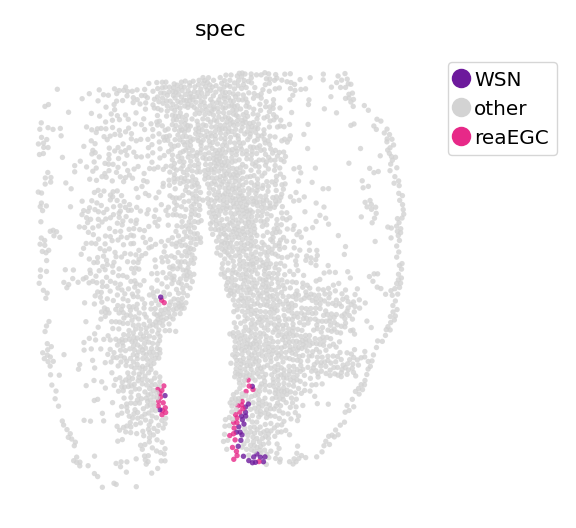

In [25]:
fig, ax = plt.subplots()
fig.set_size_inches(3,3)
st.pl.space(adata, color=['spec'], pointsize=0.05,
            color_key={'other':'#D3D3D3',sender_ct:color_key[sender_ct],receptor_ct:color_key[receptor_ct]},
            show_legend='upper left',
            ax=ax)
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
fig.savefig("2DPI_sub_cci_"+sender_ct+"_"+receptor_ct+"_cell_pair.pdf")

In [27]:
os.getcwd()

'/DATA/User/zuolulu/06.axolotl'

'plot gene TNC and SDC1'

In [19]:
adata.var[adata.var['hs_gene'].isin(['TNC'])]

,Axolotl_ID,hs_gene
Axolotl_ID,,
AMEX60DD050822,AMEX60DD050822,TNC


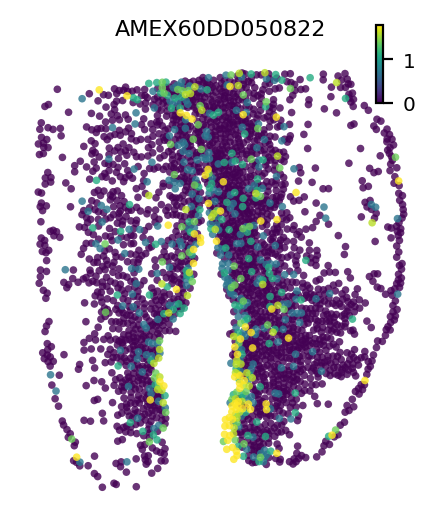

In [20]:
fig, ax = plt.subplots()
fig.set_size_inches(3,3)
st.pl.space(adata,color=['AMEX60DD050822'], pointsize=0.1,
            #olor_key={'other':'#D3D3D3','reaEGC':'#e72988','WSN':'#04047d'},
            show_legend='upper left',
            ax = ax)
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
#fig.savefig("2DPI_sub_cci_WSN_reaEGC_lr_pair_SDC1.pdf")

In [21]:
adata.var[adata.var['hs_gene'].isin(['SDC1'])]

,Axolotl_ID,hs_gene
Axolotl_ID,,
AMEX60DD033101,AMEX60DD033101,SDC1


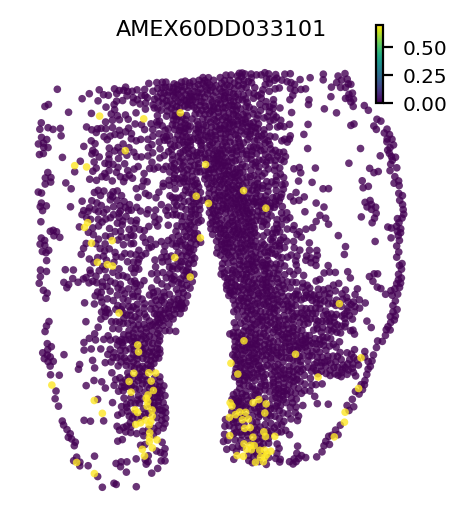

In [22]:
fig, ax = plt.subplots()
fig.set_size_inches(3,3)
st.pl.space(adata,color=['AMEX60DD033101'], pointsize=0.1,
            #olor_key={'other':'#D3D3D3','reaEGC':'#e72988','WSN':'#04047d'},
            show_legend='upper left',
            ax = ax)
fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
#fig.savefig("2DPI_sub_cci_WSN_reaEGC_lr_pair_SDC1.pdf")

### panel g

In [33]:
df1=pd.read_csv("/DATA/User/zuolulu/06.axolotl/plot_heatmap_input_RL.csv",index_col=0)
reaEGC = df1['human_ligand'].tolist()
WSN = df1['human_receptor'].tolist()

In [34]:
WSN = dyn.ext.enrichr(genes = WSN, organism='mouse',outdir='./enrichr/').results
reaEGC = dyn.ext.enrichr(genes = reaEGC, organism='mouse',outdir='./enrichr/').results

In [40]:
WSN = WSN.sort_values('Adjusted P-value',ascending=True)[0:10]
reaEGC = reaEGC.sort_values('Adjusted P-value',ascending=True)[0:10]
WSN['group'] = 'WSN'
reaEGC['group'] = 'reaEGC'

In [41]:
df = pd.concat([WSN,reaEGC],axis=0)

In [42]:
df['description'] = [x[:-12] for x in list(df['Term'])]
df['-log10_Pvalue'] = -np.log10(df['Adjusted P-value'])

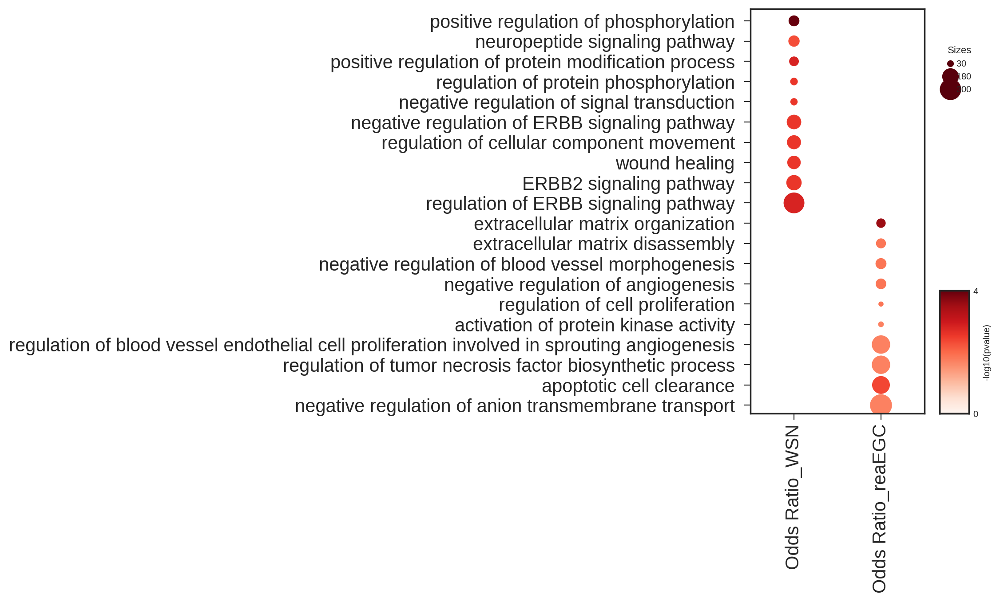

In [44]:
new_keys = {'item_key': 'description','group_key': 'group','sizes_key': 'Odds Ratio','color_key':'-log10_Pvalue'} 
dp = dotplot.DotPlot.parse_from_tidy_data(df, **new_keys) 
sct = dp.plot(size_factor=1, cmap='Reds',cluster_row=True) 
plt.savefig("2DPI_sub_cci_GO.pdf")

## 3. time data analysis
    reaEGC-...-nptxEX
    reaEGC-...-dpEX

### panel h

In [23]:
dpi_2=ad.read("../06.axolotl/data/mydata/2DPI_injury_sub.h5ad")
dpi_5=ad.read("../06.axolotl/data/mydata/5DPI_injury_sub.h5ad")
dpi_10=ad.read("../06.axolotl/data/mydata/10DPI_injury_sub.h5ad")
dpi_15=ad.read("../06.axolotl/data/mydata/15DPI_injury_sub.h5ad")
dpi_20=ad.read("../06.axolotl/data/mydata/20DPI_injury_sub.h5ad")
dpi_30=ad.read("../06.axolotl/data/mydata/30DPI_injury_sub.h5ad")
dpi_60=ad.read("../06.axolotl/data/mydata/60DPI_injury_sub.h5ad")
control=ad.read("../06.axolotl/data/mydata/uninj_injury_sub.h5ad")

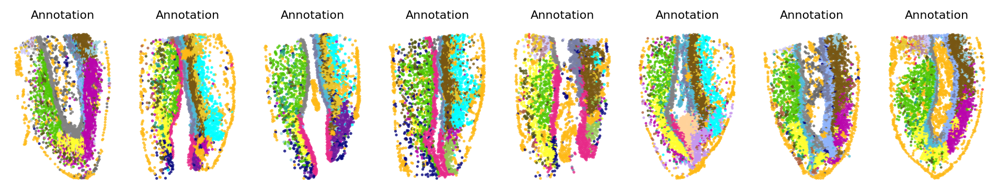

In [61]:
adata.uns['__type'] = 'UMI'
fig, axes = plt.subplots(ncols=8,)
fig.set_size_inches(12,2)
st.pl.space(control, color=['Annotation'], pointsize=0.05,color_key=color_key,show_legend=False,ax=axes[0],save_show_or_return='return')
st.pl.space(dpi_2, color=['Annotation'], pointsize=0.05,color_key=color_key,show_legend=False,ax=axes[1],save_show_or_return='return')
st.pl.space(dpi_5, color=['Annotation'], pointsize=0.05,color_key=color_key,show_legend=False,ax=axes[2],save_show_or_return='return')
st.pl.space(dpi_10, color=['Annotation'], pointsize=0.05,color_key=color_key,show_legend=False,ax=axes[3],save_show_or_return='return')
st.pl.space(dpi_15, color=['Annotation'], pointsize=0.05,color_key=color_key,show_legend=False,ax=axes[4],save_show_or_return='return')
st.pl.space(dpi_20, color=['Annotation'], pointsize=0.05,color_key=color_key,show_legend=False,ax=axes[5],save_show_or_return='return')
st.pl.space(dpi_30, color=['Annotation'], pointsize=0.05,color_key=color_key,show_legend=False,ax=axes[6],save_show_or_return='return')
st.pl.space(dpi_60, color=['Annotation'], pointsize=0.05,color_key=color_key,show_legend=False,ax=axes[7],save_show_or_return='return')
#fig.subplots_adjust(right=0.7)
plt.rcParams['pdf.fonttype'] = 42
#fig.savefig("15DPI.sub.cluster.anno.pdf")
fig.savefig("time.sub.cluster.anno.new.pdf")

### panel j

#### 2. nptxEX

In [42]:
time = ['uninj', '2DPI', '5DPI', "10DPI", "15DPI","20DPI","30DPI","60DPI"]
cluster = {'0':['nptxEX','ribEGC'],
         '2':['reaEGC','WSN'],
         '5':['reaEGC','WSN'],
         '10':['reaEGC','IMN','nptxEX'],
         '15':['reaEGC','IMN'],
         '20':['reaEGC','rIPC3','rIPC4','dpEX','nptxEX'],
         '30':['nptxEX','ribEGC'],
         '60':['nptxEX','ribEGC'],}

In [43]:
for i,j in enumerate([0,2,5,10,15,20,30,60]):
    adata = ad.read("../06.axolotl/data/mydata/"+time[i]+"_injury_sub.h5ad")
    a = cluster[str(j)]
    df = pd.DataFrame({
            "celltype_sender":np.repeat(a, len(a)),
            "celltype_receiver": list(a)*len(a),})
    df = df[df['celltype_sender'] != df['celltype_receiver']]
    df["celltype_pair"] = df["celltype_sender"].str.cat(df["celltype_receiver"], sep="-")
    
    res = {}
    for k in df['celltype_pair']:
        s,r = k.split(sep='-')
        res[k] = st.tl.find_cci_two_group(adata,
                       path='/DATA/User/zuolulu/spateo-release/spateo/tools/database/',
                       species='axolotl',
                       group='Annotation',
                       sender_group= s,
                       receiver_group = r,
                       filter_lr='outer',
                       min_pairs = 0,
                       min_pairs_ratio = 0,
                       top = 20,)
    globals()['DPI_'+str(j)] = pd.DataFrame(columns=res[df['celltype_pair'][1]]['lr_pair'].columns)
    for l in df.index:
        res[df['celltype_pair'][l]]['lr_pair'] = res[df['celltype_pair'][l]]['lr_pair'].sort_values('lr_co_exp_ratio',ascending=False)[0:3]
        res[df['celltype_pair'][l]]['lr_pair']['time'] = time[i]
        globals()['DPI_'+str(j)] = pd.concat([globals()['DPI_'+str(j)],res[df['celltype_pair'][l]]['lr_pair']],axis=0,join='outer')

In [56]:
nptxEX = pd.concat([DPI_0, DPI_2, DPI_5, DPI_10, DPI_15,DPI_20,DPI_30,DPI_60],axis=0,join='outer')
df = nptxEX[(nptxEX['lr_co_exp_num']>=2) & (nptxEX['lr_co_exp_ratio']>0.05)]
df.drop_duplicates(subset=['human_ligand','human_receptor','time'],keep='first',inplace=True)

##### plotly charts

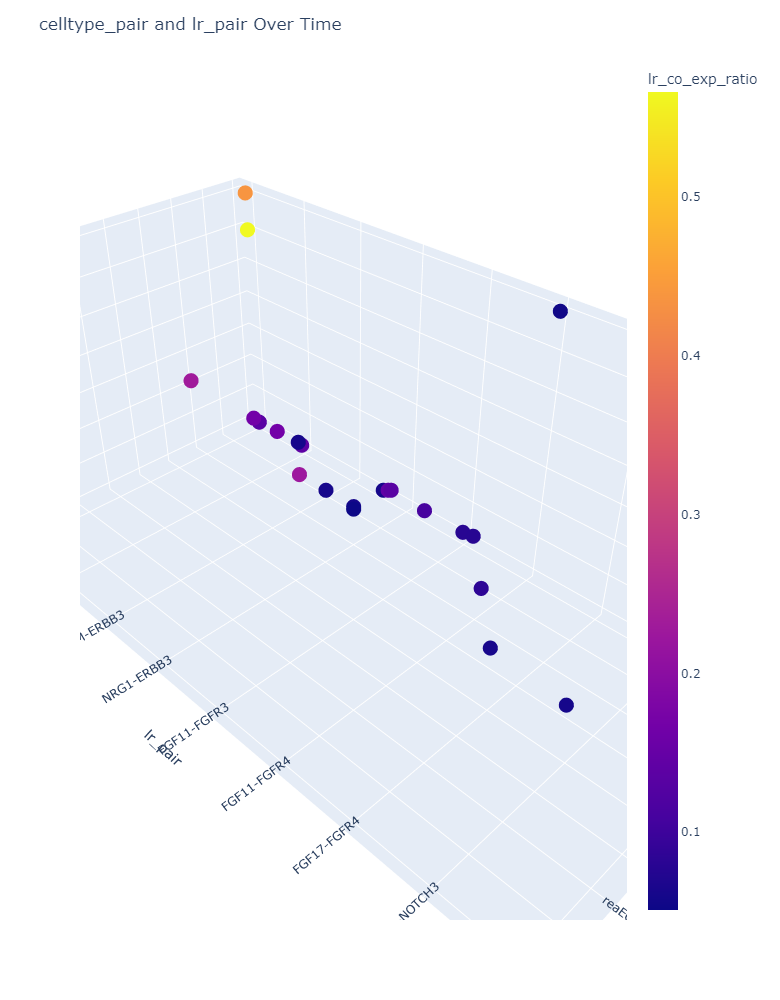

In [58]:
import plotly.express as px
fig = px.scatter_3d(df, x='sr_pair', y='lr_pair', z='time',
              color='lr_co_exp_ratio')

fig.update_layout(height=1000, width=1000,
                  title='celltype_pair and lr_pair Over Time')

fig.show()

##### dotplot

In [64]:
test1=df.pivot(index='lr_pair', columns="time", values="lr_co_exp_ratio").fillna(0).T
test2=df.pivot(index='lr_pair', columns="time", values="lr_co_exp_ratio_pvalue").fillna(1).T

In [65]:
time = ['uninj', '2DPI', '5DPI', "10DPI", "15DPI","20DPI","30DPI","60DPI"]
test1 = test1.loc[time]
test2 = test2.loc[time]

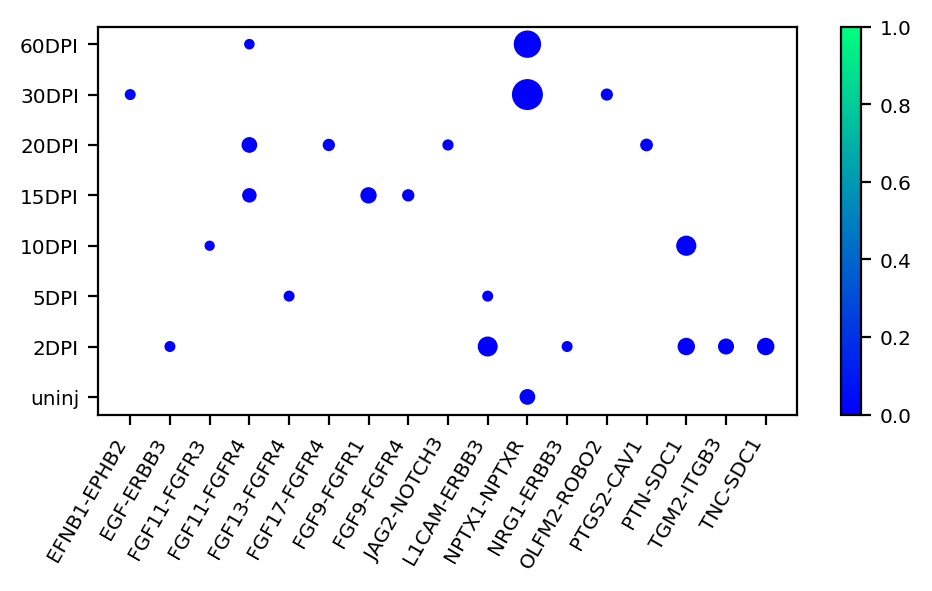

In [73]:
fig = plt.figure()
fig.set_size_inches(5,3)
m,n=(test1.shape[1],test1.shape[0]) 
x=np.linspace(1,2,m)
y=np.linspace(1,2,n)
X,Y=np.meshgrid(x,y)
S=test1.to_numpy()*200 #lr_co_exp_ratio:size
C=test2.to_numpy() #lr_co_exp_ratio_pvalue:size
plt.scatter(X, Y,s=S,c=C,cmap='winter')
plt.yticks(y,test1.index.tolist())
plt.xticks(x,test1.columns.tolist(),rotation=60,ha='right')
plt.colorbar() 
plt.tight_layout()
plt.gcf().subplots_adjust(bottom=0.3)
plt.savefig("nptxEX_dotplot.pdf")
plt.show()

#### 3.dpEX

In [88]:
time = ['uninj','2DPI', '5DPI', "10DPI", "15DPI","20DPI","30DPI","60DPI"]
cluster = {'0':['wntEGC','dpEX'],
         '2':['reaEGC','MCG','dpEX'],
         '5':['reaEGC','MCG','dpEX'],
         '10':['reaEGC','MCG','mpEX'],
         '15':['reaEGC','MCG','dpEX'],
         '20':['reaEGC','rIPC3','rIPC4','dpEX','TLNBL'],
         '30':['wntEGC','TLNBL','dpEX'],
         '60':['wntEGC','TLNBL','dpEX'],}

In [89]:
for i,j in enumerate([0,2,5,10,15,20,30,60]):
    adata = ad.read("../06.axolotl/data/mydata/"+time[i]+"_injury_sub.h5ad")
    a = cluster[str(j)]
    df = pd.DataFrame({
            "celltype_sender":np.repeat(a, len(a)),
            "celltype_receiver": list(a)*len(a),})
    df = df[df['celltype_sender'] != df['celltype_receiver']]
    df["celltype_pair"] = df["celltype_sender"].str.cat(df["celltype_receiver"], sep="-")
    
    res = {}
    for k in df['celltype_pair']:
        s,r = k.split(sep='-')
        res[k] = st.tl.find_cci_two_group(adata,
                       path='/DATA/User/zuolulu/spateo-release/spateo/tools/database/',
                       species='axolotl',
                       group='Annotation',
                       sender_group= s,
                       receiver_group = r,
                       filter_lr='outer',
                       min_pairs = 0,
                       min_pairs_ratio = 0,
                       top = 20,)
    globals()['DPI_'+str(j)] = pd.DataFrame(columns=res[df['celltype_pair'][1]]['lr_pair'].columns)
    for l in df.index:
        res[df['celltype_pair'][l]]['lr_pair'] = res[df['celltype_pair'][l]]['lr_pair'].sort_values('lr_co_exp_ratio',ascending=False)[0:3]
        res[df['celltype_pair'][l]]['lr_pair']['time'] = time[i]
        globals()['DPI_'+str(j)] = pd.concat([globals()['DPI_'+str(j)],res[df['celltype_pair'][l]]['lr_pair']],axis=0,join='outer')

In [90]:
dpEX = pd.concat([DPI_0, DPI_2, DPI_5, DPI_10, DPI_15,DPI_20,DPI_30,DPI_60],axis=0,join='outer')
df = dpEX[(dpEX['lr_co_exp_num']>=2) & (dpEX['lr_co_exp_ratio']>0.05)]
df.drop_duplicates(subset=['human_ligand','human_receptor','time'],keep='first',inplace=True)

##### 3d plot chart

In [91]:
import plotly.express as px
fig = px.scatter_3d(df, x='sr_pair', y='lr_pair', z='time',
              color='lr_co_exp_ratio')

fig.update_layout(height=800, width=800,
                  title='celltype_pair and lr_pair Over Time')

fig.show()

##### dotplot

In [92]:
test1=df.pivot(index='lr_pair', columns="time", values="lr_co_exp_ratio").fillna(0).T
test2=df.pivot(index='lr_pair', columns="time", values="lr_co_exp_ratio_pvalue").fillna(1).T

In [93]:
time = ['uninj', '2DPI', '5DPI', "10DPI", "15DPI","20DPI","30DPI","60DPI"]
test1 = test1.loc[time]
test2 = test2.loc[time]

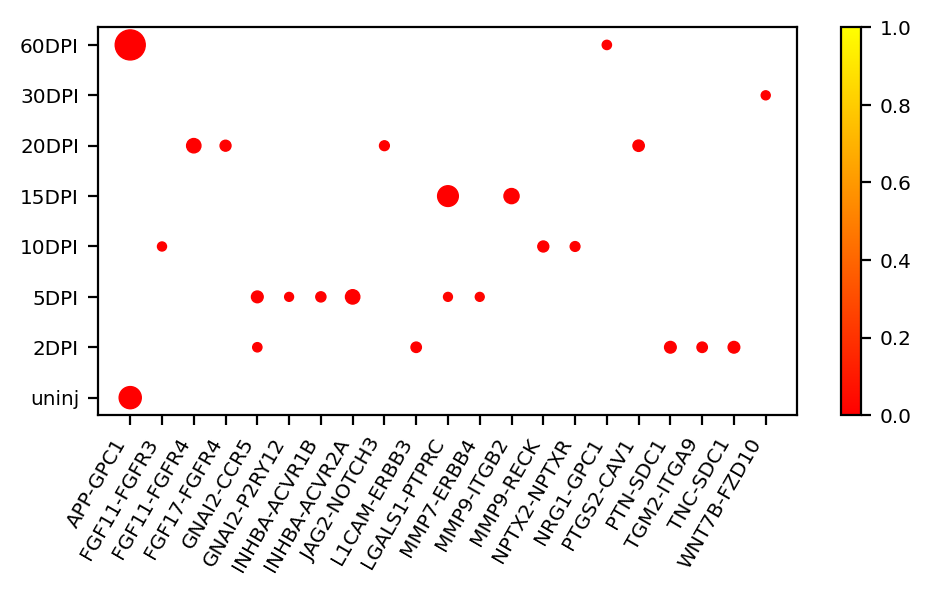

In [94]:
fig = plt.figure()
fig.set_size_inches(5,3)
m,n=(test1.shape[1],test1.shape[0]) 
x=np.linspace(1,2,m)
y=np.linspace(1,2,n)
X,Y=np.meshgrid(x,y)
S=test1.to_numpy()*200 #lr_co_exp_ratio:size
C=test2.to_numpy() #lr_co_exp_ratio_pvalue:size
plt.scatter(X, Y,s=S,c=C,cmap='autumn')
plt.yticks(y,test1.index.tolist())
plt.xticks(x,test1.columns.tolist(),rotation=60,ha='right')
plt.colorbar() 
plt.tight_layout()
plt.gcf().subplots_adjust(bottom=0.3)
plt.savefig("dpEX_dotplot.pdf")
plt.show()

### panel i

In [7]:
dpi_2_df = dpi_2.obs['Annotation'].value_counts().sort_index()
dpi_5_df = dpi_5.obs['Annotation'].value_counts().sort_index()
dpi_10_df = dpi_10.obs['Annotation'].value_counts().sort_index()
dpi_15_df = dpi_15.obs['Annotation'].value_counts().sort_index()
dpi_20_df = dpi_20.obs['Annotation'].value_counts().sort_index()
dpi_30_df = dpi_30.obs['Annotation'].value_counts().sort_index()
dpi_60_df = dpi_60.obs['Annotation'].value_counts().sort_index()
control_df = control.obs['Annotation'].value_counts().sort_index()

In [8]:
df = pd.concat([control_df,dpi_2_df, dpi_5_df, dpi_10_df, dpi_15_df, dpi_20_df,dpi_30_df,dpi_60_df], axis=1).fillna(0)
df.columns=['uninj', '2DPI', '5DPI', "10DPI", "15DPI","20DPI","30DPI","60DPI"]
df_res = (df/df.sum(axis=0)).T
df_res

,CCKIN,CMPN,CP,IMN,MCG,MPIN,MSN,NPYIN,NTNG1EX,OBNBL,...,WSN,dpEX,mpEX,nptxEX,rIPC3,rIPC4,reaEGC,ribEGC,sfrpEGC,wntEGC
uninj,0.017001,0.017304,0.074378,0.000000,0.005768,0.000000,0.063449,0.012143,0.000000,0.000000,...,0.000000,0.072860,0.120522,0.220097,0.000000,0.000000,0.000000,0.030965,0.027930,0.137523
2DPI,0.000000,0.005980,0.000000,0.000000,0.035174,0.018994,0.111150,0.000000,0.000000,0.129089,...,0.019698,0.079845,0.070348,0.023215,0.000000,0.000000,0.088639,0.001055,0.045023,0.003869
5DPI,0.012633,0.003948,0.000000,0.000000,0.055270,0.025266,0.052507,0.000000,0.000000,0.069878,...,0.094749,0.045006,0.124358,0.003553,0.000000,0.000000,0.101856,0.002764,0.038689,0.054481
10DPI,0.000000,0.002795,0.005280,0.037888,0.059006,0.000000,0.179503,0.001242,0.000000,0.126087,...,0.000000,0.014907,0.131988,0.020186,0.000000,0.000000,0.138820,0.000000,0.035714,0.000621
15DPI,0.001043,0.030935,0.000000,0.035454,0.037539,0.000000,0.145638,0.015989,0.001738,0.012165,...,0.000000,0.104275,0.080987,0.008690,0.000000,0.000000,0.174140,0.000000,0.086896,0.023636
20DPI,0.000000,0.005155,0.000000,0.000000,0.000000,0.011046,0.146294,0.000000,0.000000,0.106529,...,0.000000,0.077074,0.068974,0.029455,0.088365,0.091065,0.031910,0.000000,0.038783,0.059647
30DPI,0.017718,0.008393,0.044762,0.000000,0.009947,0.014921,0.171278,0.000000,0.000000,0.000000,...,0.000000,0.082375,0.105689,0.070873,0.000000,0.000000,0.000000,0.102269,0.060305,0.066211
60DPI,0.023393,0.017730,0.000000,0.000000,0.000000,0.013297,0.138882,0.018468,0.004186,0.000000,...,0.000000,0.095543,0.137405,0.094804,0.000000,0.000000,0.000000,0.077813,0.014036,0.053189


In [9]:
color_key={'CCKIN': '#99cfdd',
 'CMPN': '#ccc8fb',
 'CP': '#666666',
 'IMN': '#95c454',
 'MCG': '#04047d',
 'MPIN': '#1c9d79',
 'MSN': '#775613',
 'NPYIN': '#b58396',
 'NTNG1EX': '#fe3030',
 'OBNBL': '#02ffff',
 'OLIGO': '#AF5F3C',
 'SCGNIN': '#e9c62a',
 'SSTIN': '#525510',
 'TLNBL': '#4fbad6',
 'UnKnown': '#D1D1D1',
 'VLMC': '#FEB915',
 'WSN': '#6D1A9C',
 'dpEX': '#fffe2e',
 'mpEX': '#4ec602',
 'nptxEX': '#b904ab',
 #'rIPC1': '#4166b0',
 #'rIPC2': '#59BE86',
 'rIPC3': '#ffd29a',         
 'rIPC4': '#C798EE',
 'reaEGC': '#e72988',
 'ribEGC': '#8eb3fb',
 'sfrpEGC': '#767da3',
 'wntEGC': '#828282',}

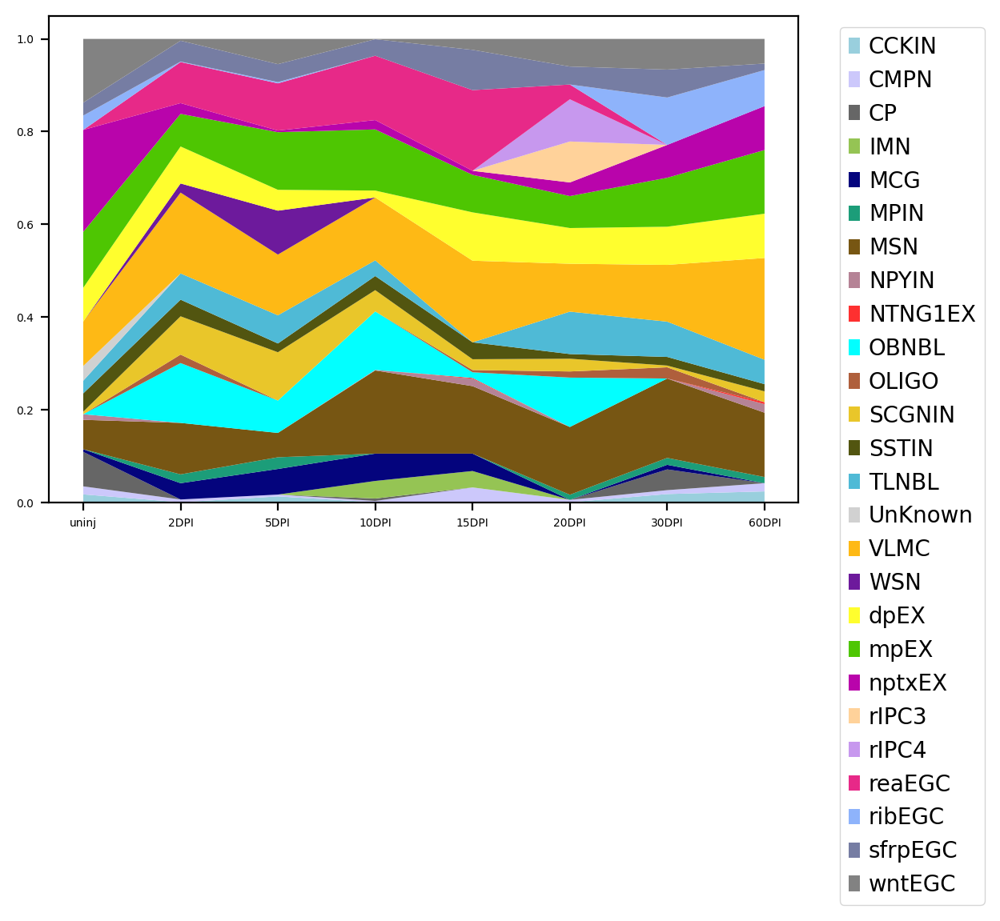

In [11]:
#### stackplot
x = ['uninj', '2DPI', '5DPI', "10DPI", "15DPI","20DPI","30DPI","60DPI"]
# Basic stacked area chart.
labels= df_res.columns
plt.stackplot(x,np.array(df_res.T), labels=labels, colors=color_key.values())
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left", prop={'size': 10})
matplotlib.rc('xtick', labelsize=5) 
matplotlib.rc('ytick', labelsize=5) 
plt.savefig("time.sub.cluster.stackplot.pdf",bbox_inches='tight')

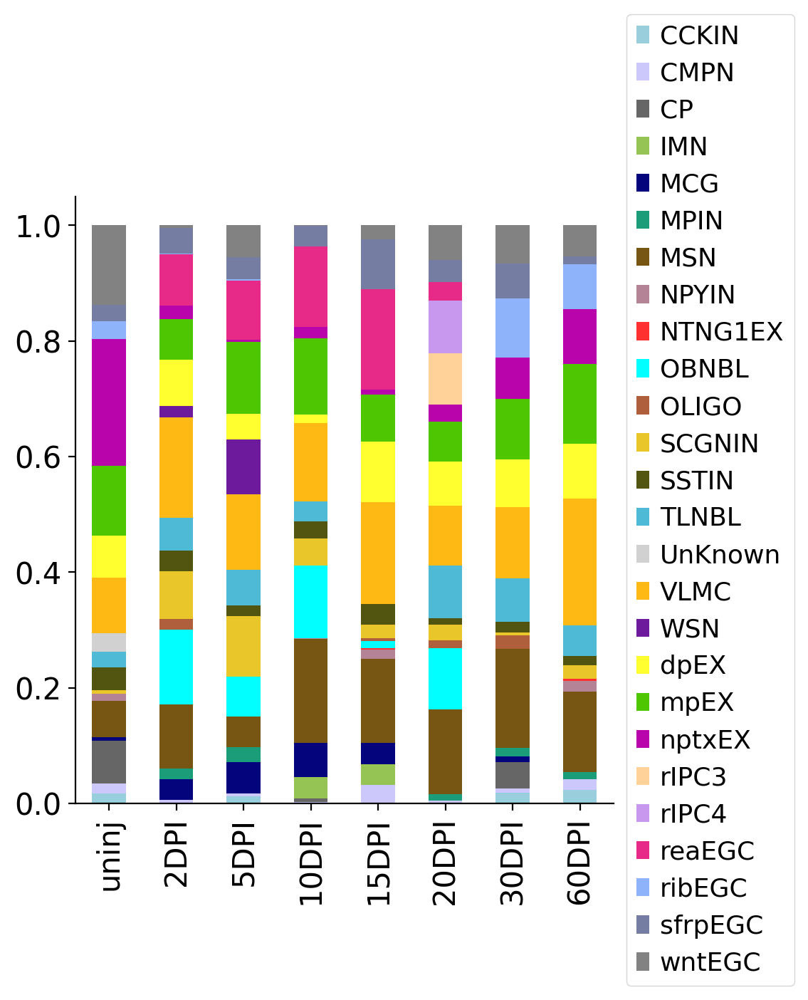

In [12]:
#### barplot
f = plt.figure(figsize=(9,6), dpi=100)
df_res.plot(kind='bar', stacked=True, ax=f.gca(), color = color_key)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), prop={'size': 13})
plt.yticks(size = 15)
plt.xticks(size = 15)
plt.subplots_adjust(right=0.6, bottom=0.2)
ax=plt.gca()
ax.spines[['top', 'right']].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.savefig("time.sub.cluster.com.barplot.pdf")

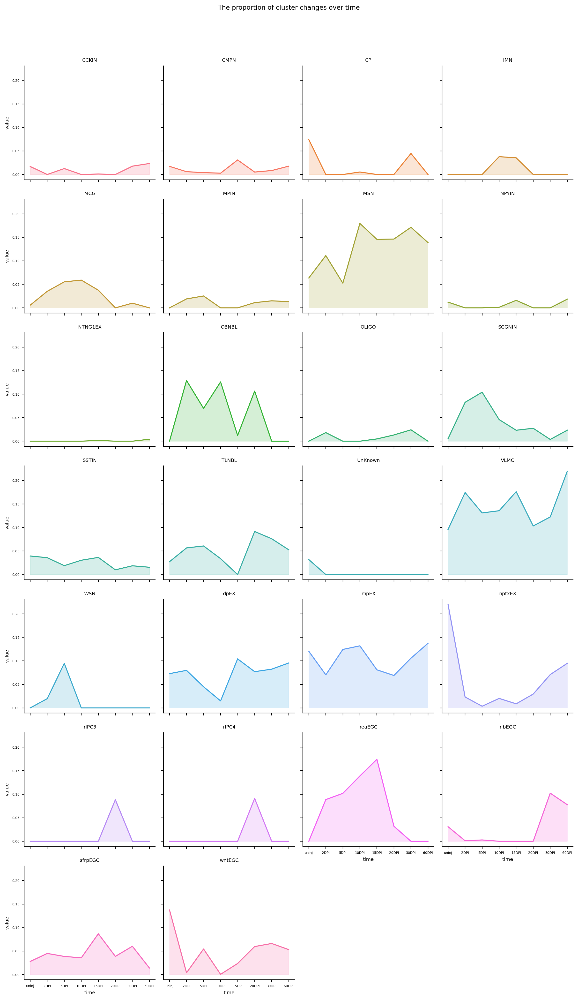

In [15]:
#### stackplot split
# Create a dataset
my_count=color_key.keys()
df = pd.DataFrame({
"cluster":np.repeat(list(color_key.keys()), 8),
"time":['uninj', '2DPI', '5DPI', "10DPI", "15DPI","20DPI","30DPI","60DPI"]*26,
"value":df_res.T.values.flatten(),
})
# Create a grid : initialize it
g = sns.FacetGrid(df, col='cluster', hue='cluster', col_wrap=4, )
# Add the line over the area with the plot function
g = g.map(plt.plot, 'time', 'value',)
# Fill the area with fill_between
g = g.map(plt.fill_between, 'time', 'value', alpha=0.2).set_titles("{col_name} cluster")
# Control the title of each facet
g = g.set_titles("{col_name}")
# Add a title for the whole plot
plt.subplots_adjust(top=0.92)
g = g.fig.suptitle('The proportion of cluster changes over time')
# Show the graph
plt.savefig("time.sub.cluster.stackplot.split.pdf",bbox_inches='tight')

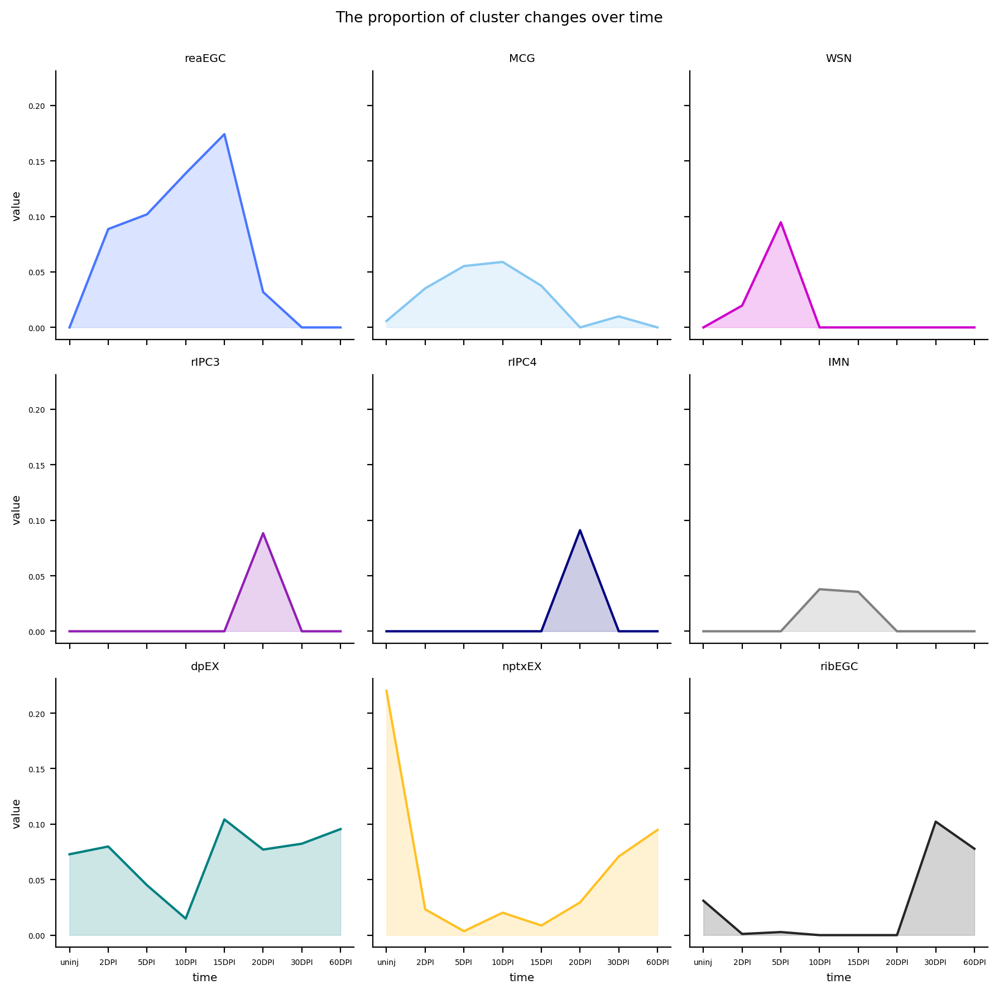

In [19]:
#### plot intrest cluster.

## find interest cluster index
#for i,j in enumerate(df_res.columns.tolist()):
#    print (i,j)
#df_res.T.values.take([22,4,16,20,21,3,17,19,23],0)

## stackplot split interest
# Create a dataset
my_count=color_key.keys()
df = pd.DataFrame({
"cluster":np.repeat(['reaEGC','MCG','WSN','rIPC3','rIPC4','IMN','dpEX','nptxEX','ribEGC'], 8),
"time":['uninj', '2DPI', '5DPI', "10DPI", "15DPI","20DPI","30DPI","60DPI"]*9,
"value":df_res.T.values.take([22,4,16,20,21,3,17,19,23],0).flatten(),
})
# Create a grid : initialize it
g = sns.FacetGrid(df, col='cluster', hue='cluster', col_wrap=3, )
# Add the line over the area with the plot function
g = g.map(plt.plot, 'time', 'value',)
# Fill the area with fill_between
g = g.map(plt.fill_between, 'time', 'value', alpha=0.2).set_titles("{col_name} cluster")
# Control the title of each facet
g = g.set_titles("{col_name}")
# Add a title for the whole plot
plt.subplots_adjust(top=0.92)
g = g.fig.suptitle('The proportion of cluster changes over time')
# Show the graph
plt.savefig("time.sub.cluster.stackplot.split.interest.pdf",bbox_inches='tight')